In [1]:
%matplotlib inline
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
matplotlib.rcParams['savefig.dpi'] = 144

In [52]:
import numpy as np
import math
import pandas as pd
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import RandomForestRegressor

In [3]:
import warnings
warnings.filterwarnings('ignore')

# Plotting the Model

Here I plotted the models vs the data for all the stop id that have the first letter '1'. I show a comparison of two different parameters for each model:
- K Nearest Neighbors:
    - n_neighbors = 4: minimum error in CV, but clearly overfitting
    - n_neighbors = 10: much less overfit, but higher CV error
    

- Random Forest:
    - max_depth = 6: both values had approx same CV error, but 6 minimizes overfitting
    - max_depth = 7: slightly more overfitting

In [4]:
trip_data_df = pd.read_csv('../Data/Crowdedness/trip_data_crowdedness_new.csv',usecols=['stop_id','day','adjusted_value','seconds'])

In [35]:
groups = trip_data_df.groupby(['stop_id','day']).size().index

In [110]:
df = pd.read_csv('../Data/Crowdedness/trip_data_crowdedness_new_periodic.csv')

In [15]:
Xcols = ['seconds']
ycol = ['adjusted_value']

In [ ]:
X_test_plot = pd.DataFrame(columns=['stop_id','day','seconds'])
for group in groups:
    print group
    for i in xrange(0,86400,600):
        X_test_plot = X_test_plot.append(pd.DataFrame([[group[0],group[1],i]],columns=['stop_id','day','seconds']))

X_test_plot = X_test_plot.sort_values(['stop_id','day','seconds']).reset_index(drop=True)

# K Nearest Neighbors

In [ ]:
fit_dict_4 = {}
fit_dict_10 = {}
for group in df.groupby(['stop_id','day']):
    fit_dict_4[group[0]] = KNeighborsRegressor(n_neighbor=4).fit(group[1][Xcols],group[1][ycol])
    fit_dict_10[group[0]] = KNeighborsRegressor(n_neighbors=10).fit(group[1][Xcols],group[1][ycol])

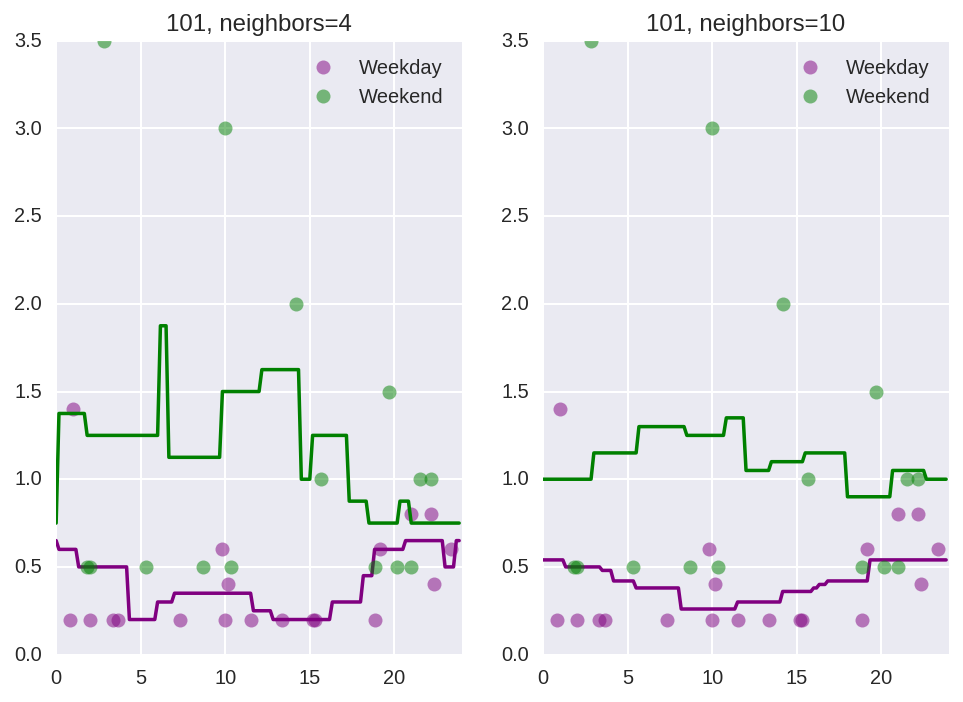

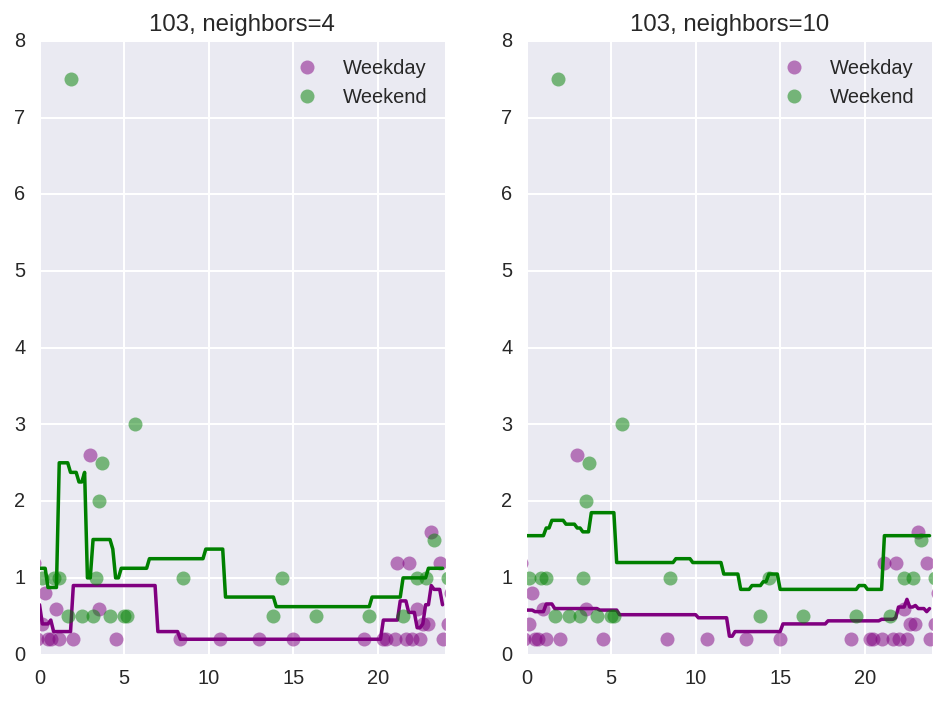

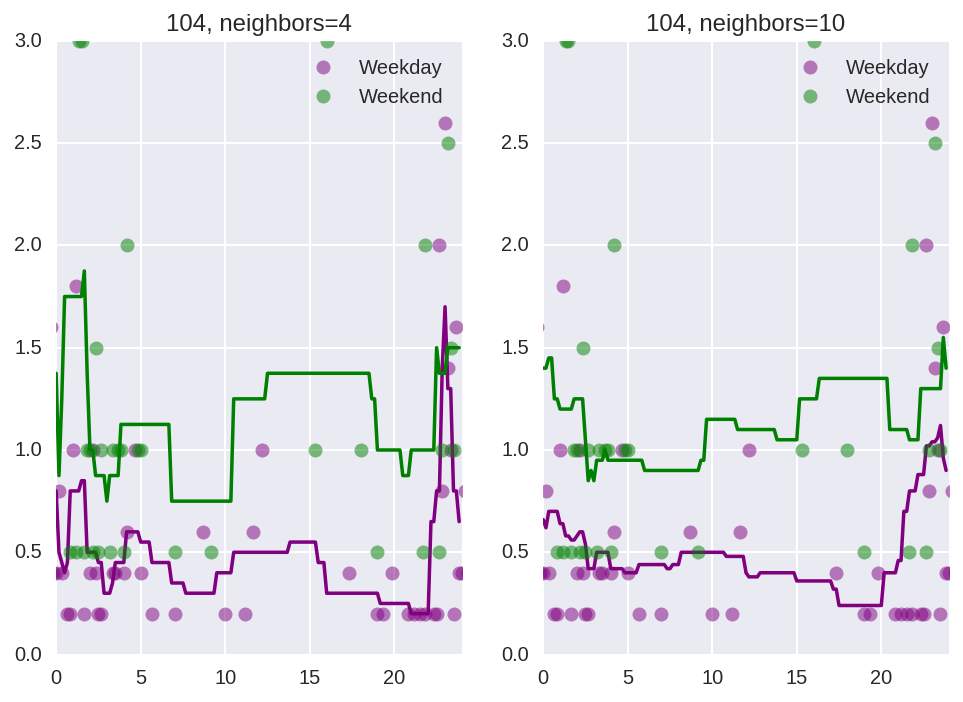

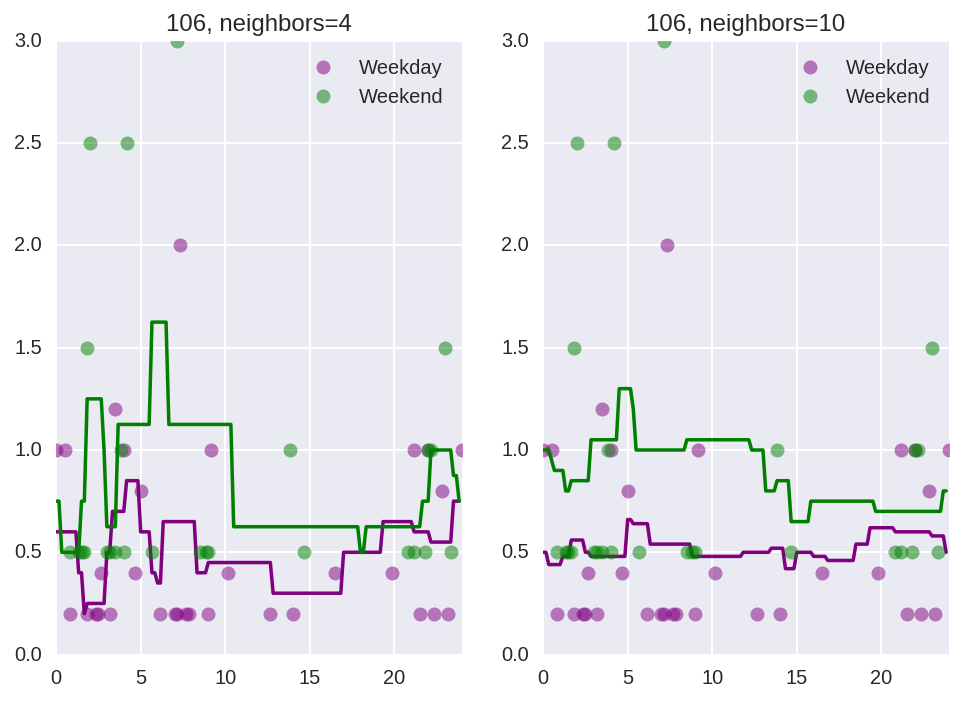

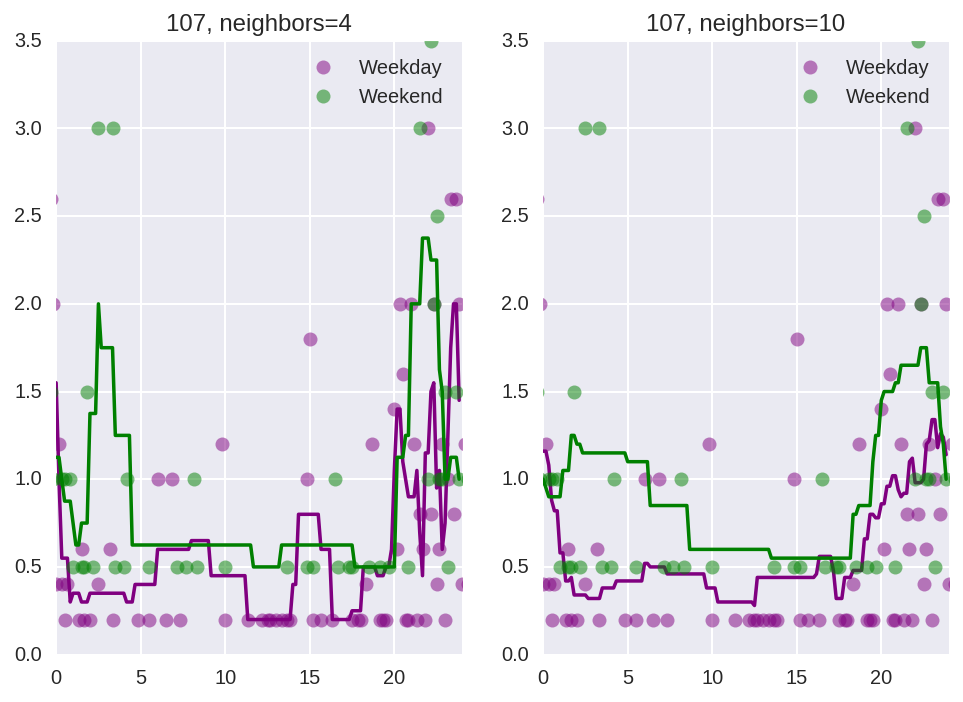

...

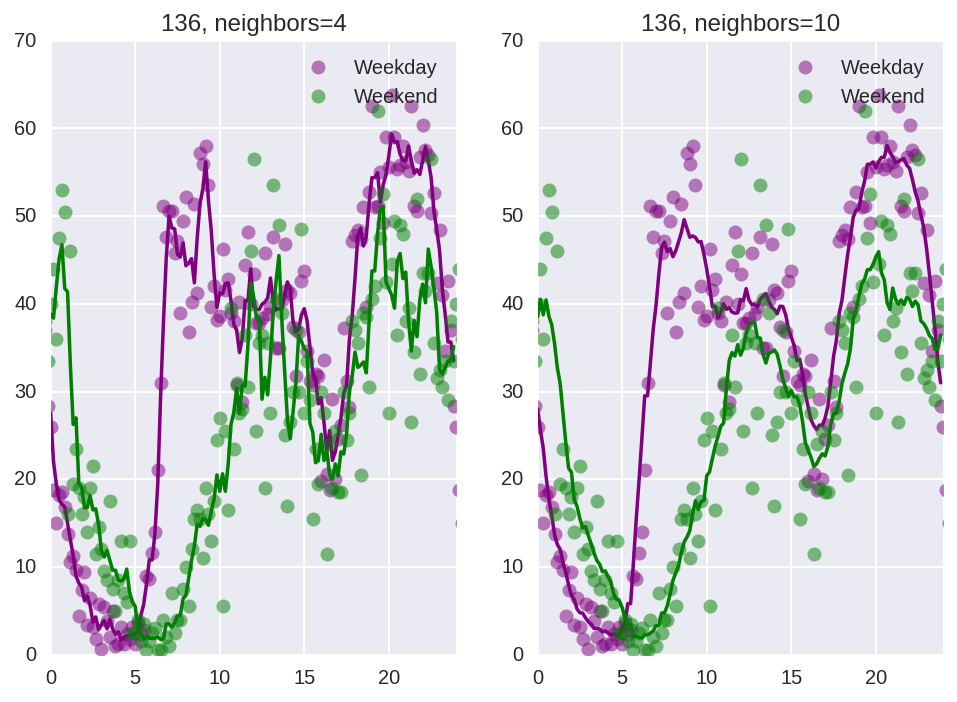

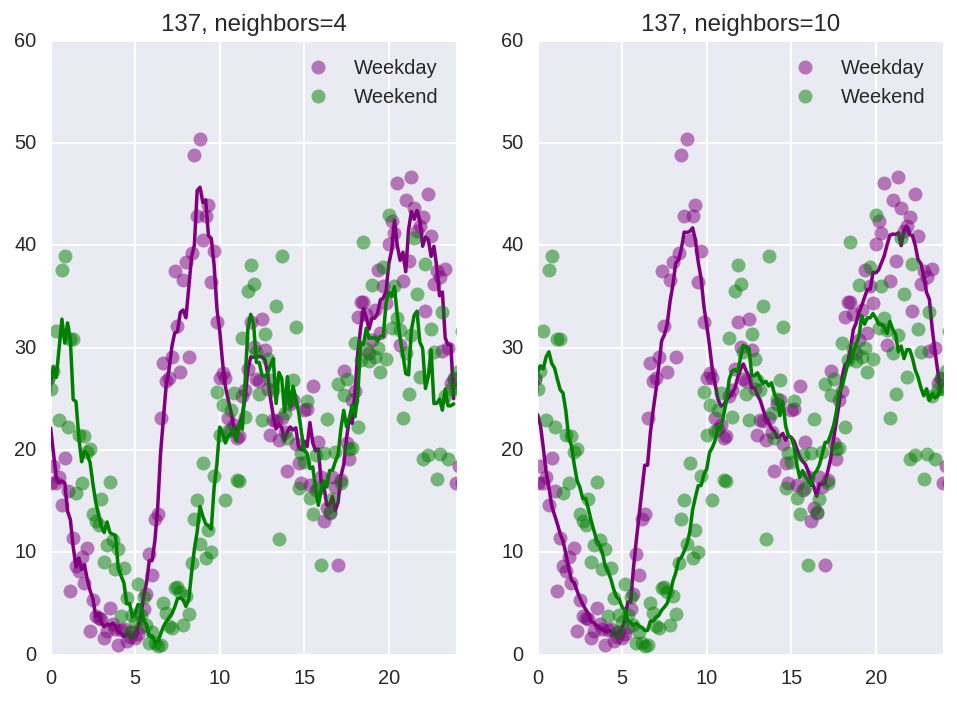

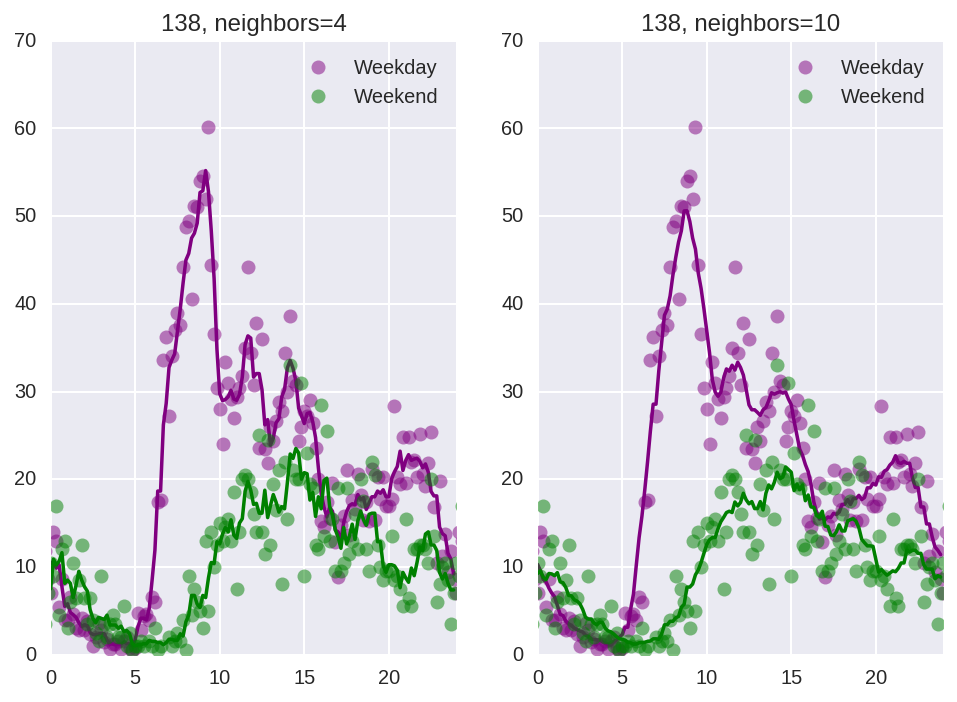

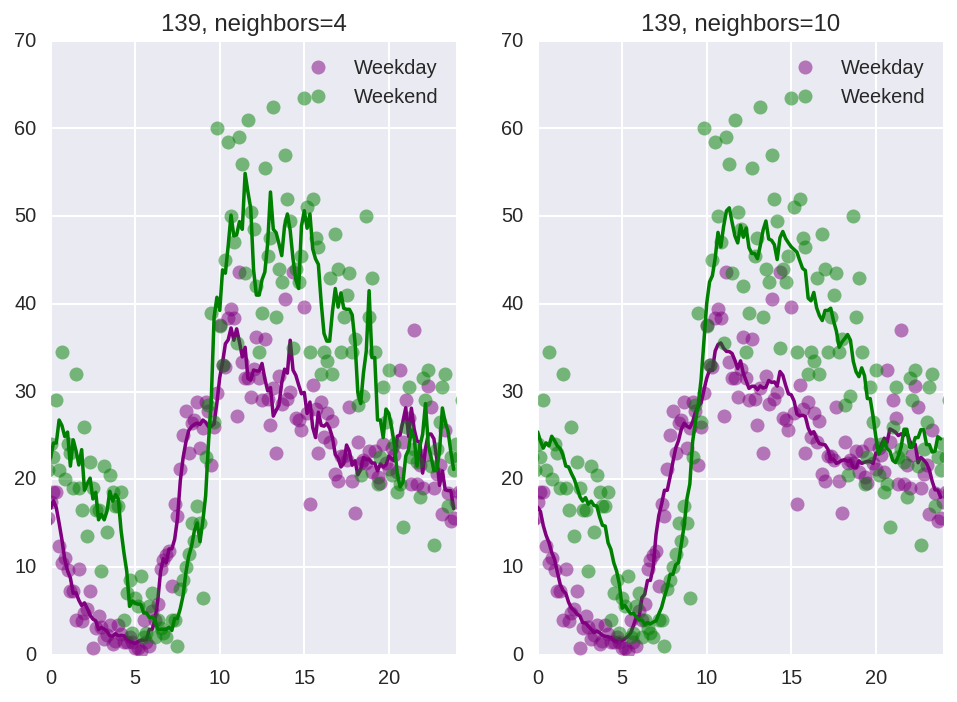

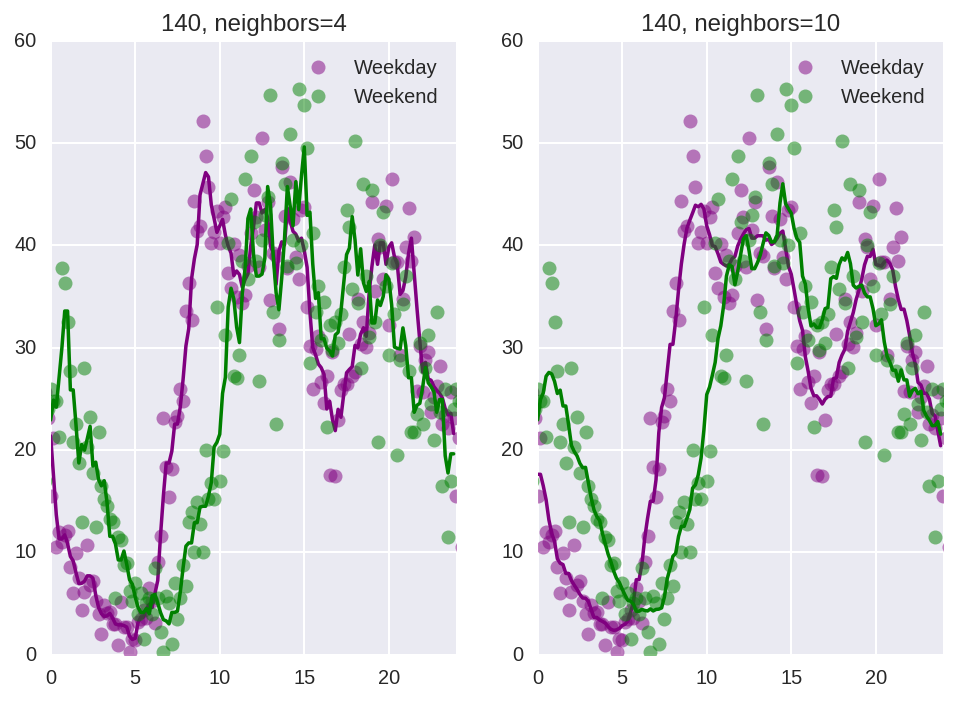

In [108]:
X_test_plot['predict_4'] = [fit_dict_4[(X_test_plot.loc[i]['stop_id'],X_test_plot.loc[i]['day'])].predict(X_test_plot.loc[i]['seconds'])[0][0] for i in X_test_plot.index]
X_test_plot['predict_10'] = [fit_dict_10[(X_test_plot.loc[i]['stop_id'],X_test_plot.loc[i]['day'])].predict(X_test_plot.loc[i]['seconds'])[0][0] for i in X_test_plot.index]
current_stop = ''
i=0
colors = {'Weekday':'purple','Weekend':'green'}
for group in groups:
    predict_df = X_test_plot[(X_test_plot['stop_id'] == group[0]) & (X_test_plot['day'] == group[1])]
    data_df = df[(df['stop_id'] == group[0]) & (df['day'] == group[1])]
    X_pred = np.array(predict_df['seconds'])/3600.
    Y_pred4 = np.array(predict_df['predict_4'])
    Y_pred10 = np.array(predict_df['predict_10'])
    X_data = np.array(data_df['seconds'])/3600.
    Y_data = np.array(data_df['adjusted_value'])
    if group[0] != current_stop:
        plt.figure(i)
        current_stop = group[0]
        i += 1
    plt.subplot(121)
    plt.plot(X_pred, Y_pred4,'-', c=colors[group[1]])
    plt.plot(X_data,Y_data,'o', alpha=0.5,c=colors[group[1]],label=group[1])
    plt.xlim(0,24)
    plt.legend()
    plt.title(group[0] + ', neighbors=4')
    plt.subplot(122)
    plt.plot(X_pred, Y_pred10,'-',c=colors[group[1]])
    plt.plot(X_data,Y_data,'o', alpha=0.5,c=colors[group[1]],label=group[1])
    plt.xlim(0,24)
    plt.legend()
    plt.title(group[0] + ', neighbors=10')

# Random Forest 

In [99]:
fit_dict_6 = {}
fit_dict_7 = {}
for group in df.groupby(['stop_id','day']):
    fit_dict_6[group[0]] = RandomForestRegressor(max_depth=6).fit(group[1][Xcols],group[1][ycol])
    fit_dict_7[group[0]] = RandomForestRegressor(max_depth=7).fit(group[1][Xcols],group[1][ycol])

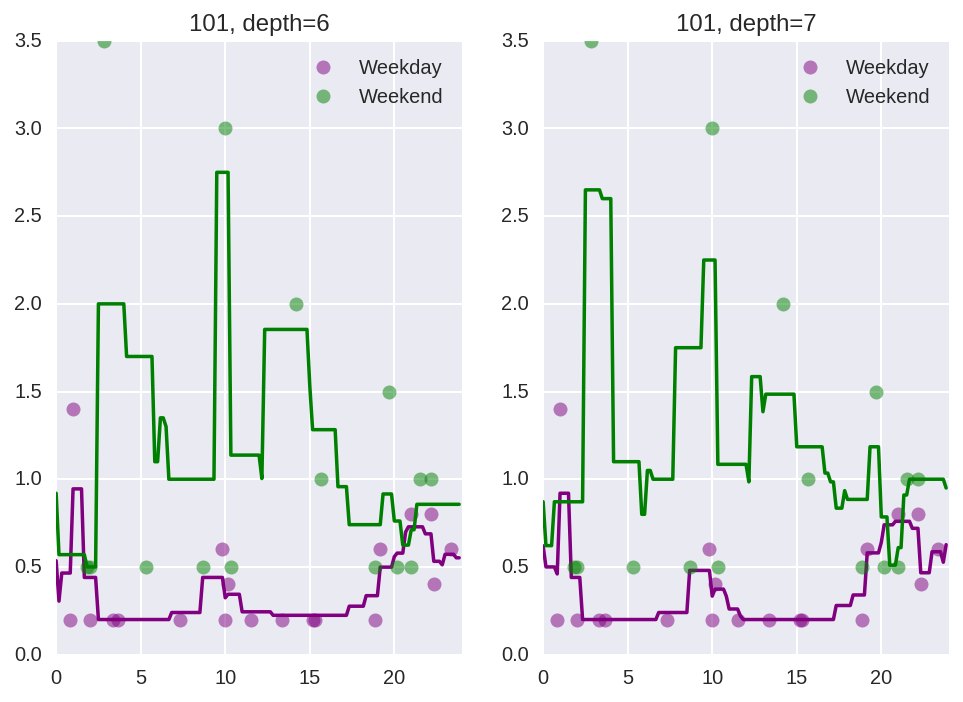

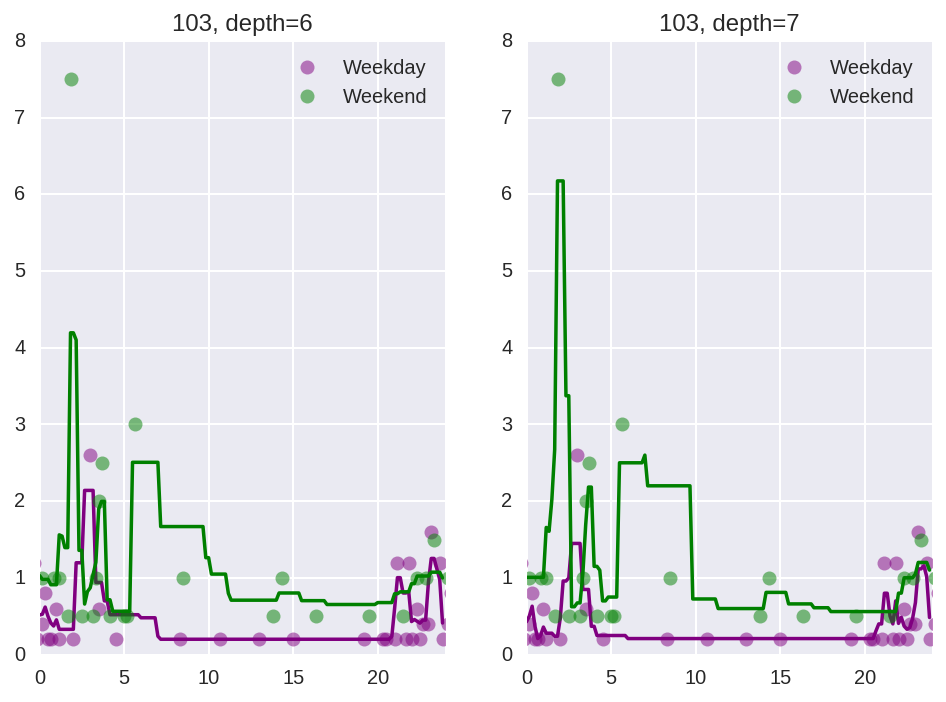

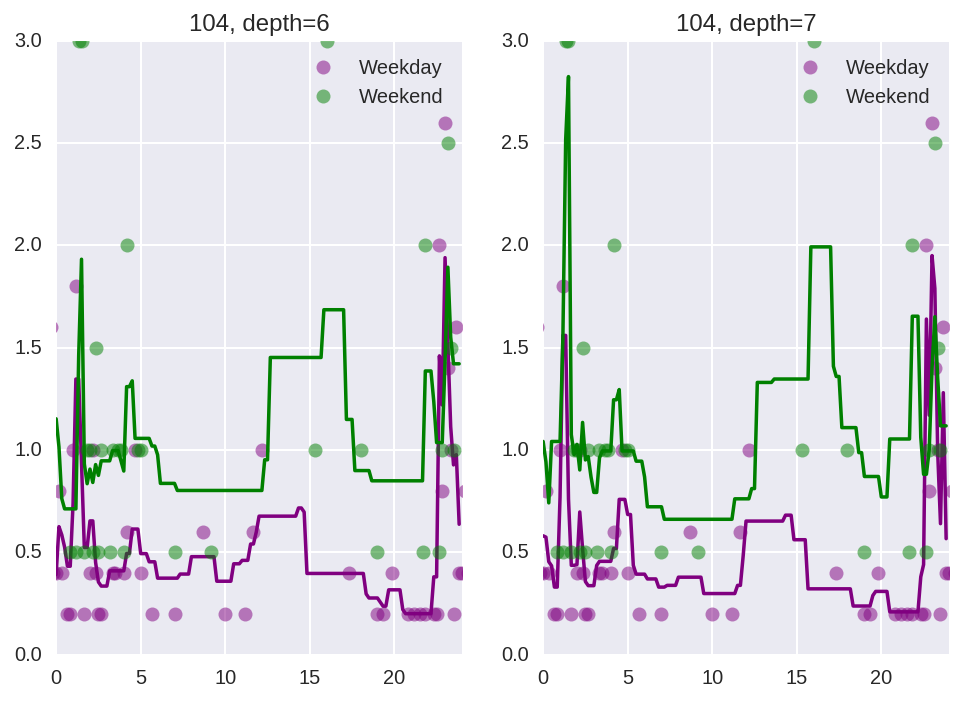

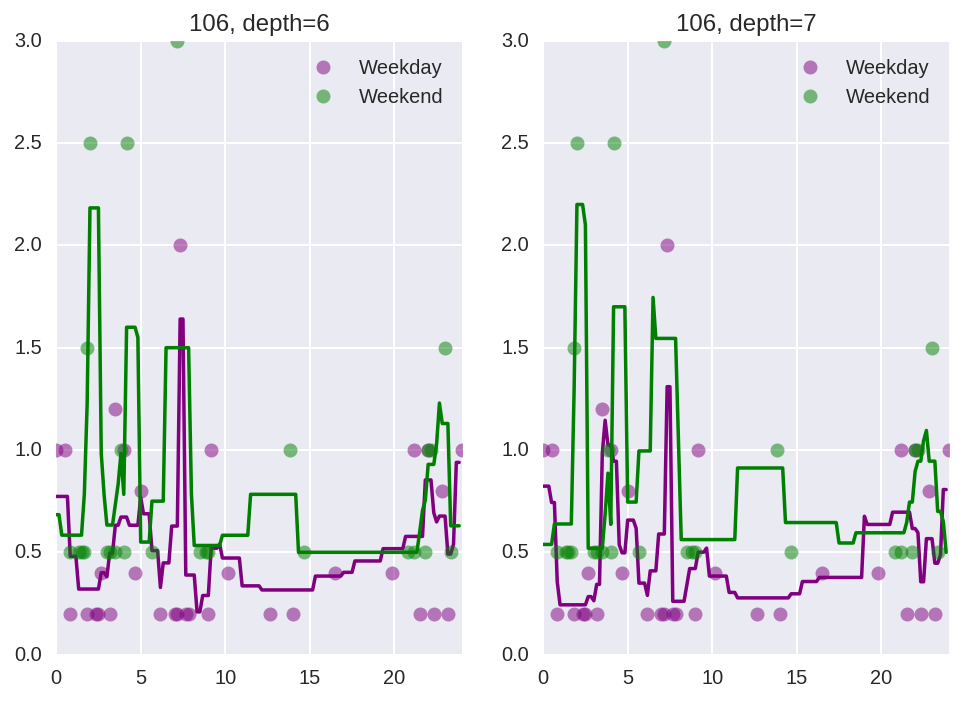

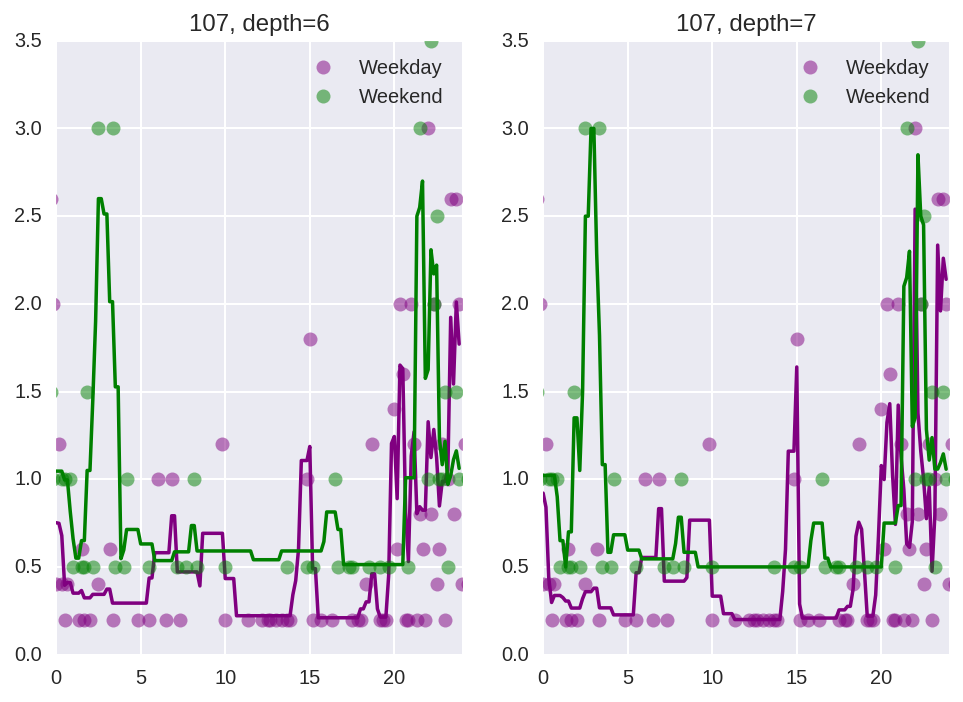

...

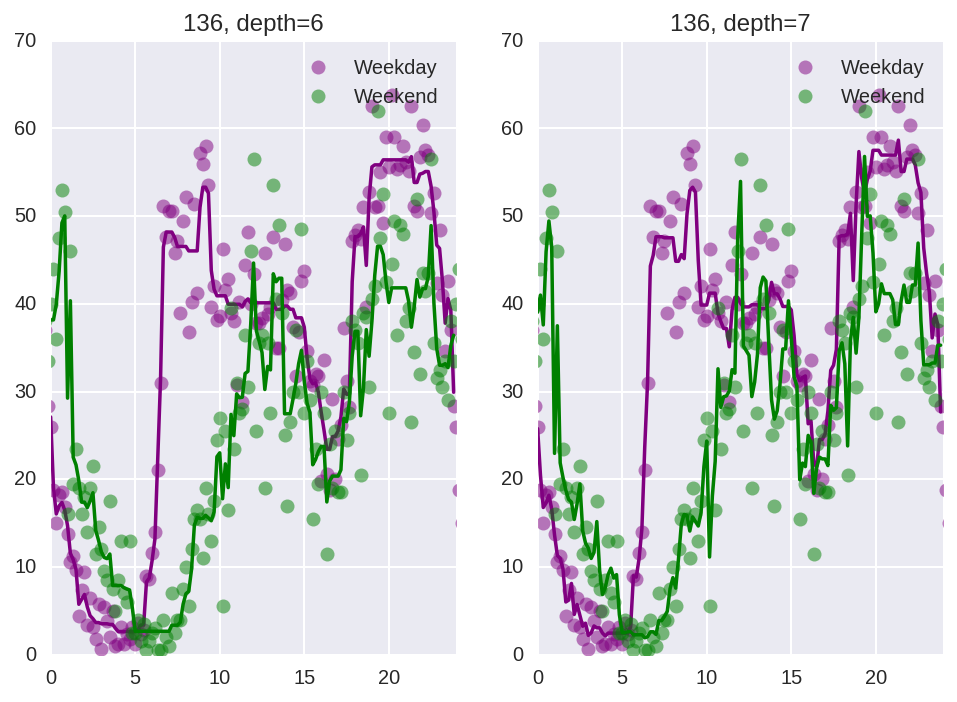

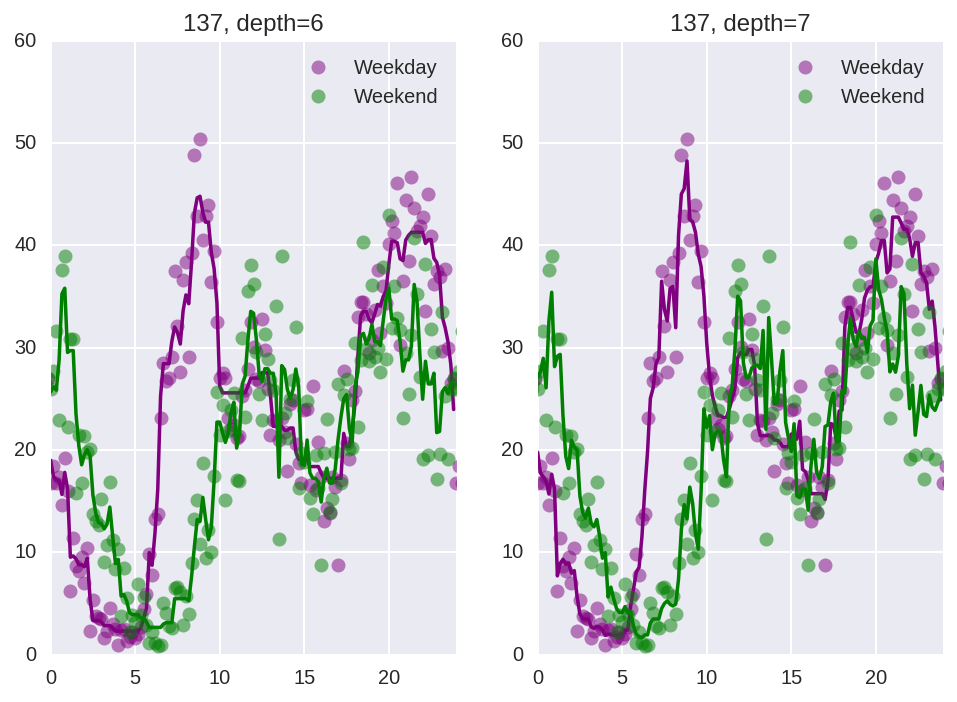

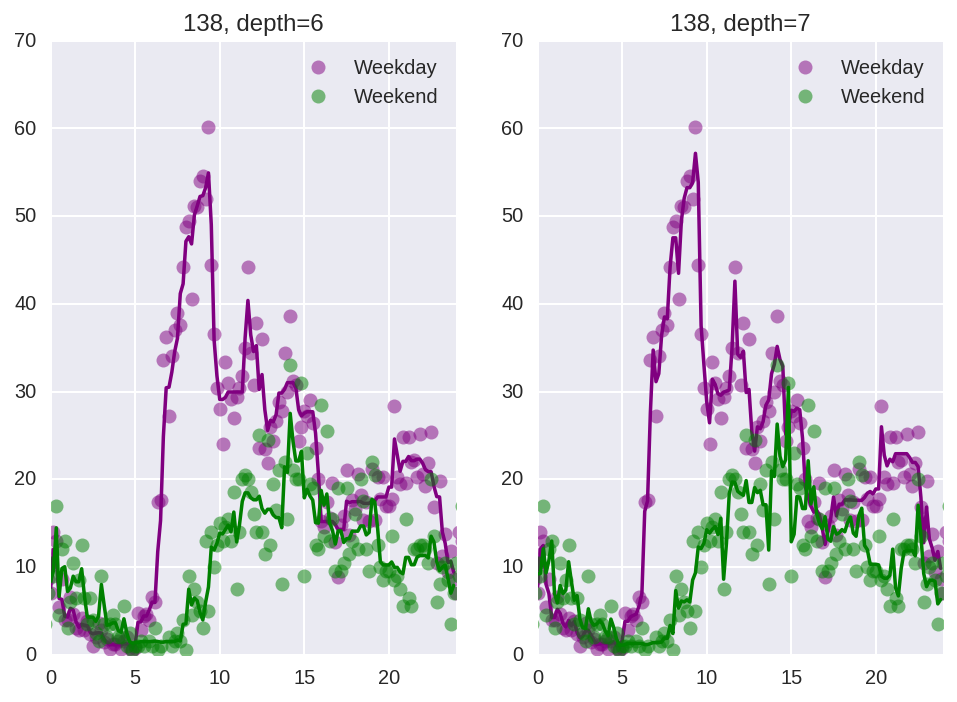

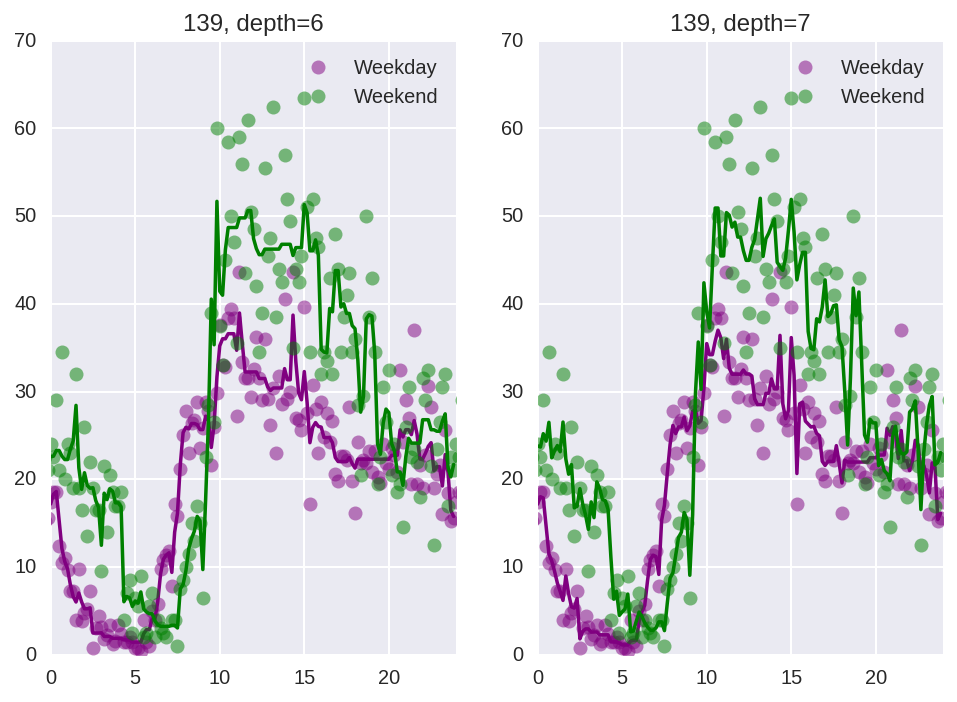

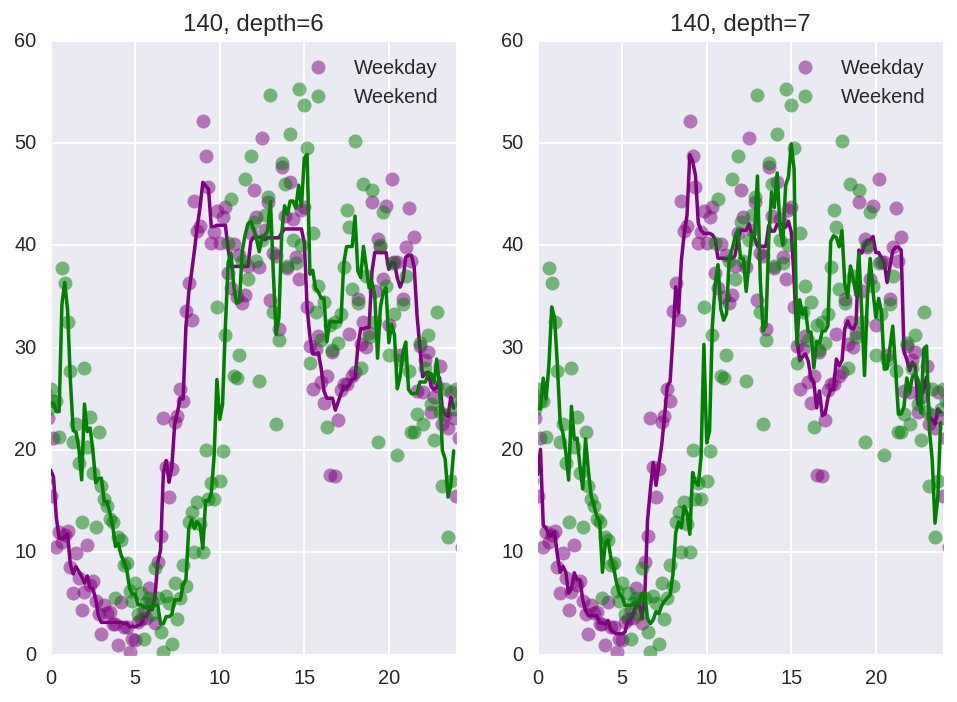

In [109]:
X_test_plot['predict_forest6'] = [fit_dict_6[(X_test_plot.loc[i]['stop_id'],X_test_plot.loc[i]['day'])].predict(X_test_plot.loc[i]['seconds'])[0] for i in X_test_plot.index]
X_test_plot['predict_forest7'] = [fit_dict_7[(X_test_plot.loc[i]['stop_id'],X_test_plot.loc[i]['day'])].predict(X_test_plot.loc[i]['seconds'])[0] for i in X_test_plot.index]
current_stop = ''
i=0
colors = {'Weekday':'purple','Weekend':'green'}
for group in groups:
    predict_df = X_test_plot[(X_test_plot['stop_id'] == group[0]) & (X_test_plot['day'] == group[1])]
    data_df = df[(df['stop_id'] == group[0]) & (df['day'] == group[1])]
    X_pred = np.array(predict_df['seconds'])/3600.
    Y_pred6 = np.array(predict_df['predict_forest6'])
    Y_pred7 = np.array(predict_df['predict_forest7'])
    X_data = np.array(data_df['seconds'])/3600.
    Y_data = np.array(data_df['adjusted_value'])
    if group[0] != current_stop:
        plt.figure(i)
        current_stop = group[0]
        i += 1
    plt.subplot(121)
    plt.plot(X_pred, Y_pred6,'-', c=colors[group[1]])
    plt.plot(X_data,Y_data,'o', alpha=0.5,c=colors[group[1]],label=group[1])
    plt.xlim(0,24)
    plt.legend()
    plt.title(group[0] + ', depth=6')
    plt.subplot(122)
    plt.plot(X_pred, Y_pred7,'-', c=colors[group[1]])
    plt.plot(X_data,Y_data,'o', alpha=0.5,c=colors[group[1]],label=group[1])
    plt.xlim(0,24)
    plt.legend()
    plt.title(group[0] + ', depth=7')
    